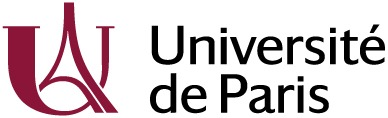
## M2 VMI - TP AD: Object detection using CNNs - Facemasks

Sylvain Lobry, 2020

Pre-requisite: having a google account (sorry about that...)

In this lab we are going to train a model to detect if people are (correctly) wearing face masks. As data, we will use [one of the datasets available on Kaggle](https://www.kaggle.com/andrewmvd/face-mask-detection).

## 1) Loading the data
You can get the data [from kaggle](https://www.kaggle.com/andrewmvd/face-mask-detection) directly, or through my [Google Drive](https://drive.google.com/drive/folders/1oxP0ept0pmOgjl1BbYaUj9Cf_X7FnI2A?usp=sharing). Then, copy it to your drive.

Now, you need to mount your drive in this VM. This is done by executing the following two lines. You will need to authorize google collab to access to your drive (it will ask you to open a link and give you a confirmation code that you will have to copy on the text field bellow).

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Now find the path to your data:

In [2]:
data_folder = "/content/drive/MyDrive/Master"
root_folder = "/content/drive/MyDrive/Master"

In [3]:
import os
import xml.etree.ElementTree as ET
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
from torch.utils.data import Dataset
import torchvision.transforms as T
from tqdm.notebook import tqdm
from PIL import Image
import numpy as np
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import cv2
import seaborn as sns

## 2) Understanding the data format
In the data folder, you have 2 sub-folders:


1.   images
2.   annotations

The images are in the png format, and the annotations are in the xml format.

**Question 1:** Open an xml file, and try to understand the information it contains and describe it. From this xml, can you guess what bounding box format is used in this dataset?

Coordinates of the top-left and bottom-right corners:

(x_min, y_min, x_max, y_max)


Let's parse one XML:

In [4]:
def get_objects(xml_file):
  annotation = ET.parse(xml_file)
  root = annotation.getroot()

  objects = []
  for obj in root.findall('object'):
    new_object = {'name': obj.find('name').text}
    bbox_tree = obj.find('bndbox')
    new_object['bbox'] =[bbox_tree.find('xmin').text,bbox_tree.find('ymin').text,bbox_tree.find('xmax').text,bbox_tree.find('ymax').text]
    objects.append(new_object)
  return objects

and show the bounding boxes on one image:

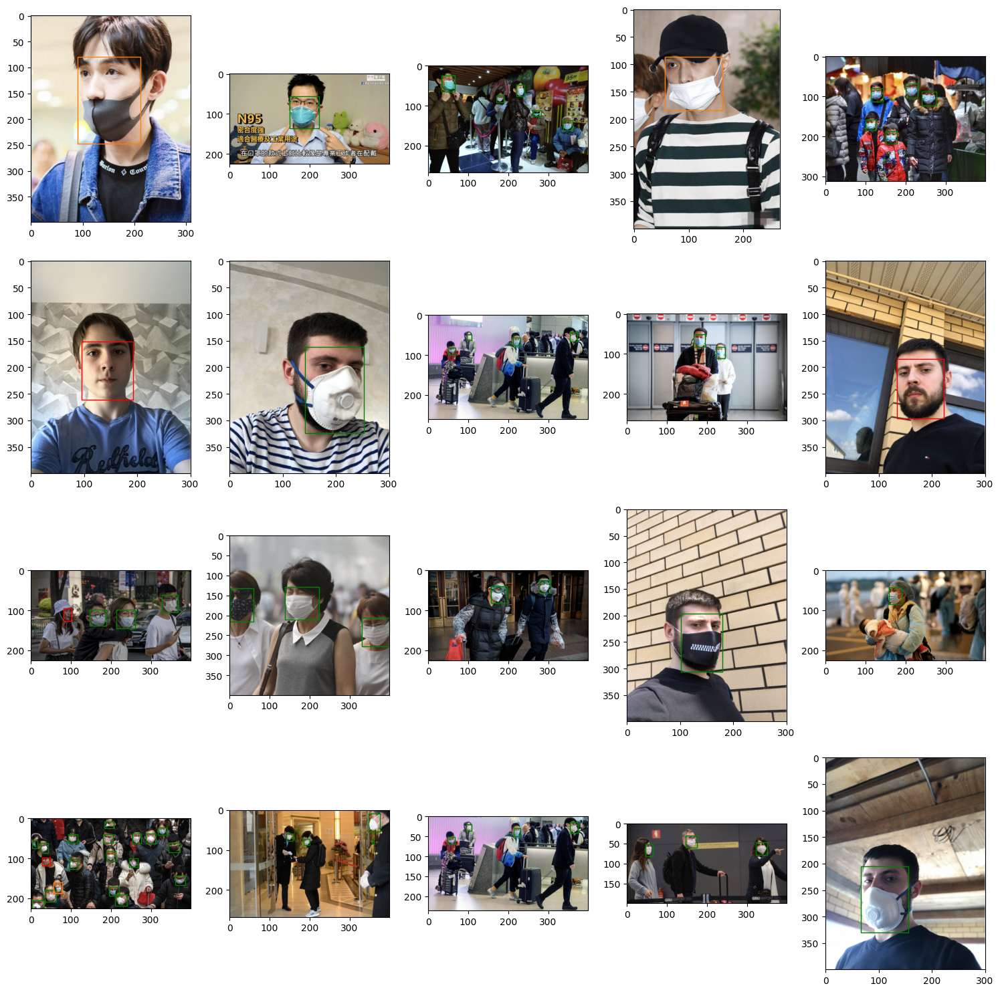

In [5]:
# Color of the bounding boxes (depending on the class)
classes_color = {'with_mask':'g', 'without_mask':'r', 'mask_weared_incorrect':'tab:orange'}
classes_index = {'with_mask':1, 'without_mask':2, 'mask_weared_incorrect':3} #Careful!! 0 is for background!!

def show_bboxes(ax, image, objects):
    ax.imshow(image)

    for annotation in objects:
        xmin, ymin, xmax, ymax = annotation['bbox']
        xmin, ymin, xmax, ymax = int(xmin),int(ymin),int(xmax),int(ymax)
        rect = patches.Rectangle((xmin,ymin), (xmax-xmin), (ymax-ymin), linewidth=1, edgecolor=classes_color[annotation['name']], facecolor='none')
        ax.add_patch(rect)
    ax.axis('on')


fig, axes = plt.subplots(4, 5, figsize=(15, 15))
indexes = range(832, 852)
for ax, index in zip(axes.ravel(), indexes):
    objects = get_objects(os.path.join(data_folder, 'annotations', 'maksssksksss' + str(index) + '.xml'))
    image = plt.imread(os.path.join(data_folder, 'images', 'maksssksksss' + str(index) + '.png'))

    show_bboxes(ax, image, objects)

plt.tight_layout()
plt.show()

## 3) Creating the dataset class

Now, we need to create a class derived from pytorch's Dataset class able to understand or data format. Since the datasert is not too big, we can load it entirely in RAM.

In [6]:
class FaceMaskDataset(Dataset):
  def __init__(self, img_folder, annotation_folder, indexes, conversion=T.ToTensor()):
    self.conversion = conversion

    self.dataset = []
    for index in tqdm(indexes):
      sample = {}
      sample['image'] = plt.imread(os.path.join(data_folder, 'images', 'maksssksksss' + str(index) + '.png'))
      sample['objects']= get_objects(os.path.join(data_folder, 'annotations', 'maksssksksss' + str(index) + '.xml'))
      sample['id'] = index
      self.dataset.append(sample)

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    target = {'boxes': [], 'labels': []}
    for obj in self.dataset[idx]['objects']:
      xmin, ymin, xmax, ymax = obj['bbox']
      xmin, ymin, xmax, ymax = float(xmin),float(ymin),float(xmax),float(ymax)
      target["boxes"].append([xmin, ymin, xmax, ymax])
      # print("------")
      # print([xmin, ymin, xmax, ymax])
      # print("------")
      target['labels'].append(classes_index[obj['name']])
    #print(type(target["boxes"]))
    target["boxes"] = torch.as_tensor(target["boxes"], dtype=torch.float32)
    #print(type(target["boxes"]))
    target["labels"] = torch.as_tensor(target['labels'], dtype=torch.int64)
    target["image_id"] = torch.tensor([self.dataset[idx]['id']])

    #img = self.dataset[idx]['image']
    img = Image.fromarray((self.dataset[idx]['image'] * 255).astype(np.uint8)).convert('RGB')
    if self.conversion is not None:
      img = self.conversion(img)
    return img, target

In [7]:
size_dataset = len(os.listdir(os.path.join(data_folder, 'images')))
print("the size of the dataset", size_dataset)
indexes=range(size_dataset)

dataset = FaceMaskDataset(img_folder=data_folder, annotation_folder=data_folder, indexes=indexes)

the size of the dataset 853


  0%|          | 0/853 [00:00<?, ?it/s]

In [8]:
print(max(indexes))

852


#Visualization of our dataset and data distribution

In [9]:
def get_affiche(dataset,type_data):
  len_data=len(dataset)
  results = get_class_distribution_from_dataset(dataset)
  print("***************************************************************************")
  print(type_data," data set size : ",len_data)
  print("Number of images with at least one mask:", results[2]," ",(results[2]/len_data)*100,"%")
  print("Number of images without any masks:", results[3]," ",(results[3]/len_data)*100,"%")
  print("***************************************************************************")
  print("Number of images with only class 1:", results[4]," ",(results[4]/len_data)*100,"%")
  print("Number of images with only class 2:", results[5]," ",(results[5]/len_data)*100,"%")
  print("Number of images with only class 3:", results[6]," ",(results[6]/len_data)*100,"%")
  print("***************************************************************************")
  print("Number of images with class 1 and class 2:", results[7]," ",(results[7]/len_data)*100,"%")
  print("Number of images with class 1 and class 3:", results[8]," ",(results[8]/len_data)*100,"%")
  print("Number of images with class 2 and class 3:", results[9]," ",(results[9]/len_data)*100,"%")
  print("Number of images with all three classes:", results[10]," ",(results[10]/len_data)*100,"%")
  print("***************************************************************************")
  print("Class distribution:", results[0])
  print("Class percentage distribution:", results[1],"\n")
  return results
def get_class_distribution_from_dataset(dataset):
    class_counts = {'with_mask': 0, 'without_mask': 0, 'mask_weared_incorrect': 0}
    images_with_mask = 0
    images_without_mask = 0
    only_class_1 = 0
    only_class_2 = 0
    only_class_3 = 0
    class_1_2 = 0
    class_1_3 = 0
    class_2_3 = 0
    class_1_2_3 = 0
    for _, label in dataset:
        class_labels = label['labels'].tolist()

        if classes_index['with_mask'] in class_labels:
            images_with_mask += 1
        else:
            images_without_mask += 1
        if class_labels.count(classes_index['with_mask']) == len(class_labels):
            only_class_1 += 1
        elif class_labels.count(classes_index['without_mask']) == len(class_labels):
            only_class_2 += 1
        elif class_labels.count(classes_index['mask_weared_incorrect']) == len(class_labels):
            only_class_3 += 1
        elif classes_index['with_mask'] in class_labels and classes_index['without_mask'] in class_labels:
            class_1_2 += 1
        elif classes_index['with_mask'] in class_labels and classes_index['mask_weared_incorrect'] in class_labels:
            class_1_3 += 1
        elif classes_index['without_mask'] in class_labels and classes_index['mask_weared_incorrect'] in class_labels:
            class_2_3 += 1
        elif classes_index['with_mask'] in class_labels and classes_index['without_mask'] in class_labels and classes_index['mask_weared_incorrect'] in class_labels:
            class_1_2_3 += 1
        for class_label in class_labels:
            if class_label == classes_index['with_mask']:
                class_counts['with_mask'] += 1
            elif class_label == classes_index['without_mask']:
                class_counts['without_mask'] += 1
            elif class_label == classes_index['mask_weared_incorrect']:
                class_counts['mask_weared_incorrect'] += 1
    total_count = sum(class_counts.values())
    class_percentages = {class_name: (count / total_count) * 100 for class_name, count in class_counts.items()}
    return class_counts, class_percentages, images_with_mask, images_without_mask, only_class_1, only_class_2, only_class_3, class_1_2, class_1_3, class_2_3, class_1_2_3

results=get_affiche(dataset,"full dataset")

***************************************************************************
full dataset  data set size :  853
Number of images with at least one mask: 768   90.03516998827668 %
Number of images without any masks: 85   9.964830011723329 %
***************************************************************************
Number of images with only class 1: 516   60.492379835873386 %
Number of images with only class 2: 60   7.033997655334115 %
Number of images with only class 3: 21   2.4618991793669402 %
***************************************************************************
Number of images with class 1 and class 2: 222   26.025791324736225 %
Number of images with class 1 and class 3: 30   3.5169988276670576 %
Number of images with class 2 and class 3: 4   0.4689331770222743 %
Number of images with all three classes: 0   0.0 %
***************************************************************************
Class distribution: {'with_mask': 3232, 'without_mask': 717, 'mask_weared_incorrect': 123

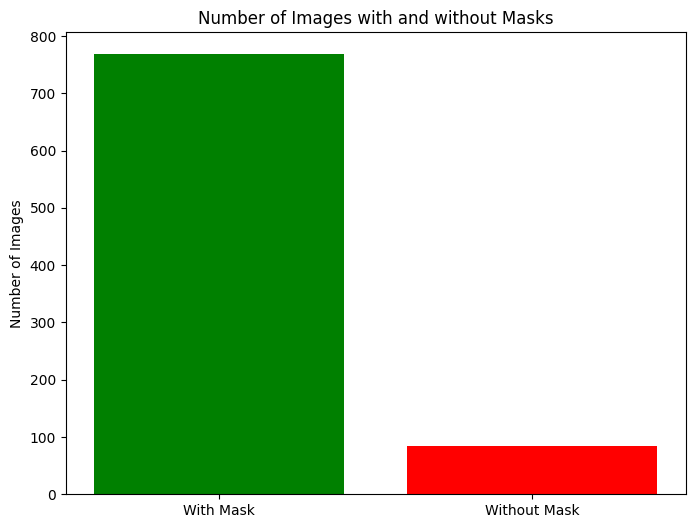

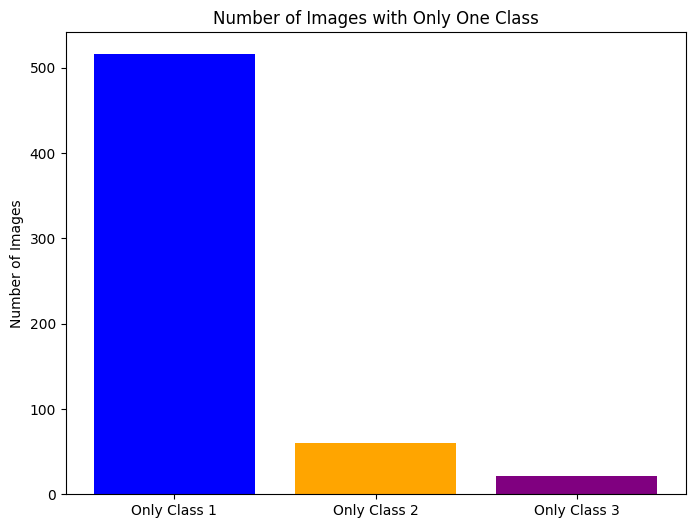

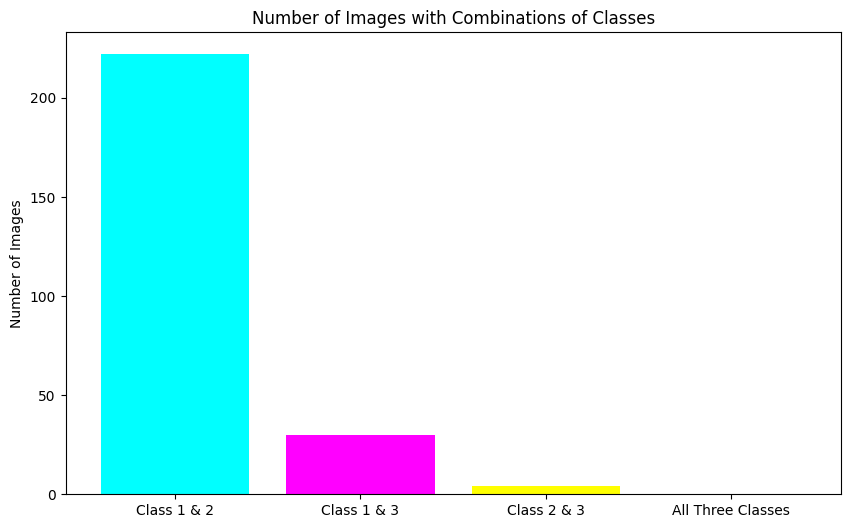

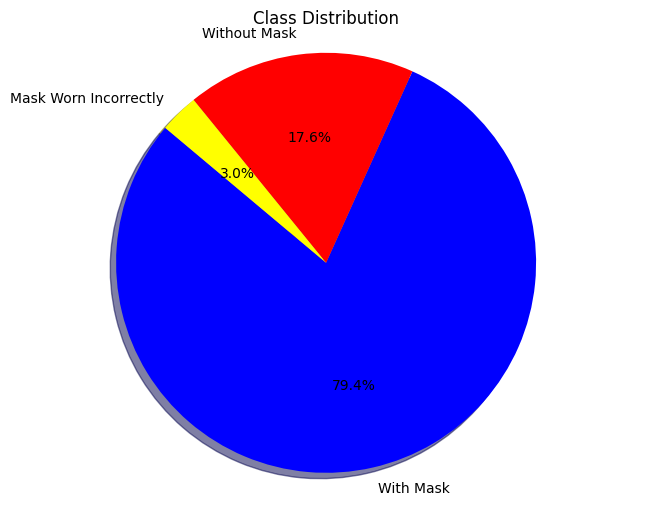

In [10]:
#************************************************************************************************************
labels = ['With Mask', 'Without Mask']
values = [results[2], results[3]]
plt.figure(figsize=(8, 6))
plt.bar(labels, values, color=['green', 'red'])
plt.title('Number of Images with and without Masks')
plt.ylabel('Number of Images')
plt.show()
#************************************************************************************************************
labels = ['Only Class 1', 'Only Class 2', 'Only Class 3']
values = [results[4], results[5], results[6]]
plt.figure(figsize=(8, 6))
plt.bar(labels, values, color=['blue', 'orange', 'purple'])
plt.title('Number of Images with Only One Class')
plt.ylabel('Number of Images')
plt.show()
#************************************************************************************************************
labels = ['Class 1 & 2', 'Class 1 & 3', 'Class 2 & 3', 'All Three Classes']
values = [results[7], results[8], results[9], results[10]]
plt.figure(figsize=(10, 6))
plt.bar(labels, values, color=['cyan', 'magenta', 'yellow', 'grey'])
plt.title('Number of Images with Combinations of Classes')
plt.ylabel('Number of Images')
plt.show()
#************************************************************************************************************
labels = ['With Mask', 'Without Mask', 'Mask Worn Incorrectly']
values = [results[0]["with_mask"], results[0]["without_mask"], results[0]["mask_weared_incorrect"]]
colors = ['blue', 'red', 'yellow']
plt.figure(figsize=(8, 6))
plt.pie(values, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Class Distribution')
plt.axis('equal')
plt.show()
#************************************************************************************************************

**Question 2:** We are going to learn from this data. By looking at it, can you find possible biases in it?

#answers
##Class imbalance:
* Class 1 is significantly represented with 79.37% of the total instances. Which automatically creates a bias, the model will then have an easier time classifying into class 1 and will also be more precise for this class.
* Class 2 is moderately represented with 17.61%. However, it remains relatively low compared to the overwhelming majority of class 1, which maintains the bias towards class 1.

* Class 3 is under-represented with only 3.02%. which greatly complicates the task whether for learning (too few train examples, validation) or for evaluation, the model will have difficulty correctly detecting this class which has not learned sufficiently.

##Image bias:
* There are 768 images with at least one mask and 85 images without a mask. This means that the dataset is biased towards images with masks. This therefore implies that the model will tend to assume that there is a mask on the image.

* There are 516 images with only class 1, 60 images with only class 2 and 21 images with only class 3. This shows a bias towards images that only have class 1. and therefore only the model will tend to excessively predict class 1.

##The class combinations in the images also show bias:

* There are 222 class 1 and class 2 images, but
Only 4 class 2 and class 3 images.
There are no images with the three classes.
This distorts the conclusions, the model will start from the principle that it is impossible to have the 3 classes at the same time, also it will tend to look for combinations of class 1 and 2 rather than 2 and 3.

##Real-world implications and potential uses:
*A model trained on this dataset can work well to detect faces with masks (answer questions with or without masks)

* but may have difficulty accurately detecting faces without masks or faces with poorly worn masks. (this is due to the small number of examples of these classes).

* The model may also be less confident (low prediction confidence score and therefore eliminated during thresholding) when predicting class 3 due to its underrepresentation.

And we can create the datasets.

**Question 3:** What is the total number of samples that we have? Does that seem sufficient to train a model? What strategy could we use for training?

#answer

We have 853 labeled images as a dataset.

>This may prove sufficient in the case of using a pre-trained and already efficient model, however in this case the classes are unbalanced which is why to have conclusive results we must implement certain strategies:

* Data Increase:
Apply random transformations to training images, such as rotations, vertical or horizontal mirroring. This increases the diversity of the training data and helps avoid overfitting.

* Used a powerful pre-trained model:
being our case for this exercise, however an increase in data is strongly recommended for this dataset in view of the highly unbalanced classes


In [11]:
size_of_the_dataset = size_dataset
# we separate our data into 80/10/10 because too little data and balanced classes
train_split_percentage = 0.8
val_split_percentage = 0.1
test_split_percentage = 0.1

print(train_split_percentage,val_split_percentage,test_split_percentage)
indexes = list(range(size_of_the_dataset))
random.shuffle(indexes)

train_indexes = indexes[:int(train_split_percentage*len(indexes))]
val_indexes = indexes[int(train_split_percentage*len(indexes)):int((train_split_percentage + val_split_percentage)*len(indexes))]
test_indexes = indexes[int((train_split_percentage + val_split_percentage)*len(indexes)):]

print(f"Effective train split = {len(train_indexes)/len(indexes)*100}%")
print(f"Effective val split = {len(val_indexes)/len(indexes)*100}%")
print(f"Effective test split = {len(test_indexes)/len(indexes)*100}%", flush=True)

# From https://github.com/pytorch/vision/blob/ce342580f3ae3f937fa5389c48b82a827b4804df/references/detection/utils.py#L235
def collate_fn(batch):
    return tuple(zip(*batch))
def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    #TODO: potentially add data augmentation
    return T.Compose(transforms)
batch_size = 3
print("Loading training set")
train_dataset = FaceMaskDataset(os.path.join(data_folder, 'images'), os.path.join(data_folder, 'annotations'), train_indexes, conversion=get_transform(True))
print("Loading validation set")
val_dataset = FaceMaskDataset(os.path.join(data_folder, 'images'), os.path.join(data_folder, 'annotations'), val_indexes, conversion=get_transform(False))
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, collate_fn=collate_fn)
val_loader = torch.utils.data.DataLoader(dataset=val_dataset, batch_size=batch_size, shuffle=False, num_workers=2, collate_fn=collate_fn)

0.8 0.1 0.1
Effective train split = 79.95310668229777%
Effective val split = 9.964830011723329%
Effective test split = 10.082063305978899%
Loading training set


  0%|          | 0/682 [00:00<?, ?it/s]

Loading validation set


  0%|          | 0/85 [00:00<?, ?it/s]

In [12]:
print(f"Effective train size = {len(train_loader)}")
print(f"Effective val size = {len(val_loader)}")
print(f"Effective test size = {size_dataset-len(val_dataset)-len(train_dataset)}")

Effective train size = 228
Effective val size = 29
Effective test size = 86


One thing which is always important is to check the data. At the sample size, we have already seen how to check that we understood the data format, and checked a few samples for corectness. At a larger scale, it is often a good idea to check the labels' distribution.

**Question 4:** Propose and implement a methodology to check the labels' distribution. Discuss your findings.

#Answer :

in order to test the distribution we can use the get_class_distribution_from_dataset implementer function for question 2,

In [ ]:
get_affiche(train_dataset,"train")
get_affiche(val_dataset,"validation")
get_affiche(test_dataset,"test")

***************************************************************************
train  data set size :  682
Number of images with at least one mask: 605   88.70967741935483 %
Number of images without any masks: 77   11.29032258064516 %
***************************************************************************
Number of images with only class 1: 402   58.94428152492669 %
Number of images with only class 2: 53   7.771260997067449 %
Number of images with only class 3: 20   2.932551319648094 %
***************************************************************************
Number of images with class 1 and class 2: 182   26.68621700879765 %
Number of images with class 1 and class 3: 21   3.0791788856304985 %
Number of images with class 2 and class 3: 4   0.5865102639296188 %
Number of images with all three classes: 0   0.0 %
***************************************************************************
Class distribution: {'with_mask': 2653, 'without_mask': 603, 'mask_weared_incorrect': 100}
Class pe

## 4) Defining the model

For this project, we propose to take a pre-trained Faster R-CNN.

Faster R-CNN is an extension of R-CNN seen during the lecture. Conceptually, both methods are very similar. The main improvements of Faster R-CNN is to share convolutional features between the region proposal part and the actual object detection part. To know more, you can read [the original article](https://arxiv.org/pdf/1506.01497.pdf).

This network has been pre-trained on [MS-COCO](https://cocodataset.org/#home), which is a classical large-scale object detection dataset.


In [13]:
#load Faster R-CNN pre-trained on COCO dataset
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
#Change the classifier head with a new one:
in_features = model.roi_heads.box_predictor.cls_score.in_features
num_classes = 4 #(3 + background)
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 104MB/s]


## 5) Training

Now that we have both the architecture and the data, we can train our model.

You should enable GPU in your collab at this point. To do so go to runtime -> Change runtime type -> Hardware accelerator and select "GPU";

In [14]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

model = model.to(device)

Using device: cuda


We can now define the training loop.

**Question 5:** How did you choose your hyper-parameters?
#Answer
My approach to hyperparameter selection (epochs, batches, learning_rate, momentum) was iterative, ensuring that the model was neither underfit nor overfit.


Changing the hyperparameters was done by monitoring the loss functions, then fine-tuning by modifying slightly, always monitoring the losses, validation was also used to choose the best hyperparameters.

By starting with:
* batch_size = 2
* number_epochs = 2
* lr=0.01
* momentum=0.9

After several iterations and tests we obtain the current values

In [15]:
number_epochs = 3
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.0001, momentum=0.95)

In [ ]:
train_loss = []
val_loss = []
for epoch in range(number_epochs):
  print(f"Starting epoch {epoch}")
  if epoch > 0:
    plt.figure()
  model.train()
  train_loss.append(0)
  for images, labels in tqdm(train_loader):
    images = list(image.to(device) for image in images)
    labels = [{k: v.to(device) for k, v in t.items()} for t in labels]
    loss_dict = model(images, labels)
    #print(loss_dict)
    losses = sum(loss for loss in loss_dict.values())
    optimizer.zero_grad()
    losses.backward()
    optimizer.step()
    train_loss[epoch] += losses.cpu().data
  train_loss[epoch] /= len(train_dataset)
  # Validation
  val_loss_epoch = 0
  with torch.no_grad():
      for images, labels in tqdm(val_loader):
          images = list(image.to(device) for image in images)
          labels = [{k: v.to(device) for k, v in t.items()} for t in labels]
          loss_dict = model(images, labels)
          losses = sum(loss for loss in loss_dict.values())
          val_loss_epoch += losses.item()
  val_loss_epoch /= len(val_loader.dataset)
  val_loss.append(val_loss_epoch)

Starting epoch 0


  0%|          | 0/228 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

Starting epoch 1


  0%|          | 0/228 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

Starting epoch 2


  0%|          | 0/228 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [16]:
save_path = "/content/drive/MyDrive/Master/my_model_detection.pth"
checkpoint = torch.load(save_path)
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
train_loss = checkpoint['train_loss']
val_loss = checkpoint['val_loss']

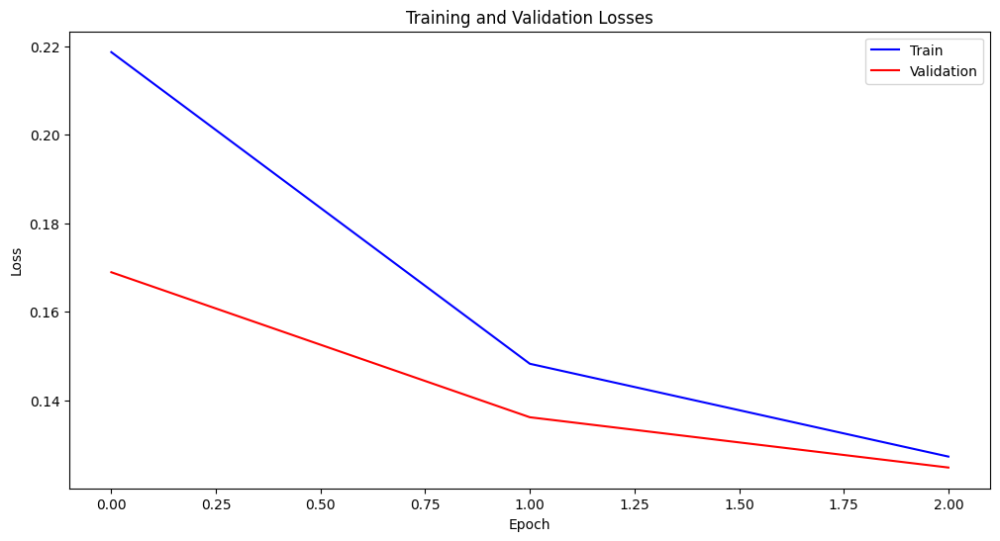

In [17]:
if epoch > 0:
    plt.figure(figsize=(12, 6))
    plt.plot(train_loss, label='Train', color='blue')
    plt.plot(val_loss, label='Validation', color='red')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Losses')
    plt.show()

In [ ]:
save_path = "/content/drive/MyDrive/Master/my_model_detection.pth"
torch.save(model.state_dict(), save_path)

checkpoint = {
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'epoch': epoch,
    'train_loss': train_loss,
    'val_loss': val_loss,
}

torch.save(checkpoint, save_path)

## 6) Evaluate the model
First, we need to load the test set:

In [18]:
print("Loading test set")
test_dataset = FaceMaskDataset(os.path.join(data_folder, 'images'), os.path.join(data_folder, 'annotations'), test_indexes, conversion=get_transform(False))
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, collate_fn=collate_fn)

threshold = 0.7

Loading test set


  0%|          | 0/86 [00:00<?, ?it/s]

In [19]:
# Testing phase
print("*********************************************** Starting testing phase ***********************************************")
model.eval()
all_predictions = []
with torch.no_grad():
    for images, labels in tqdm(test_loader):
        images = list(image.to(device) for image in images)
        labels = [{k: v.to(device) for k, v in t.items()} for t in labels]
        predictions = model(images)
        all_predictions.extend(predictions)

*********************************************** Starting testing phase ***********************************************


  0%|          | 0/29 [00:00<?, ?it/s]

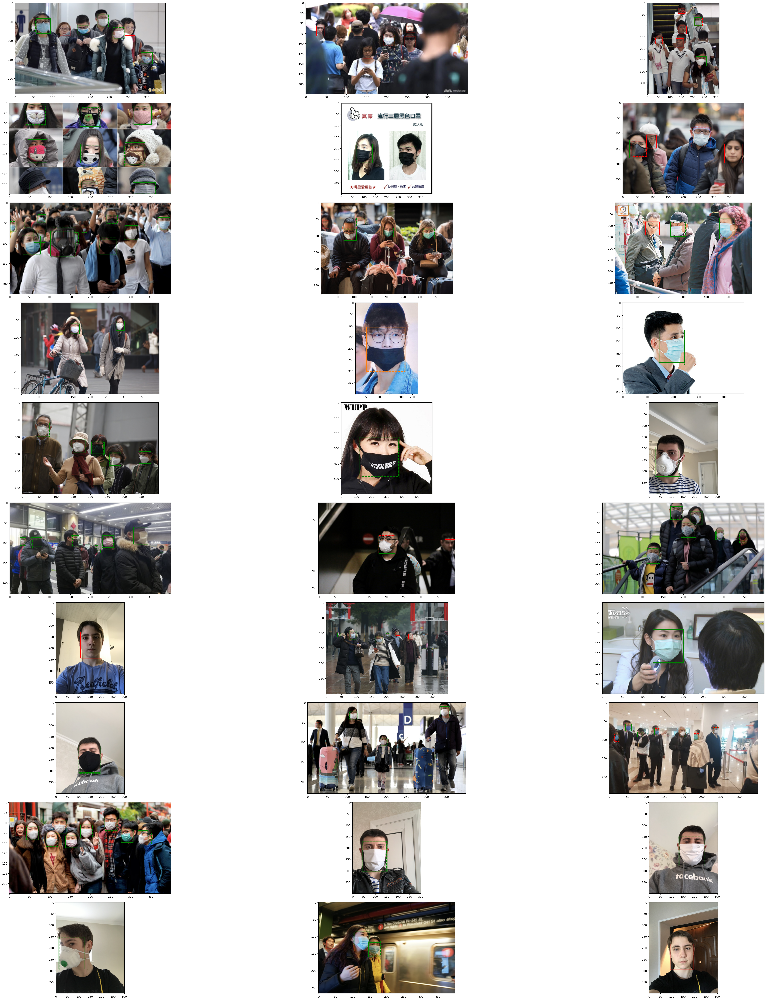

In [20]:
def show_bboxes(ax, image, ground_truth, predictions=None):
    ax.imshow(image)
    for annotation in ground_truth:
        xmin, ymin, xmax, ymax = annotation['bbox']
        xmin, ymin, xmax, ymax = int(xmin),int(ymin),int(xmax),int(ymax)
        rect = patches.Rectangle((xmin,ymin), (xmax-xmin), (ymax-ymin), linewidth=1, edgecolor=classes_color[annotation['name']], facecolor='none', label='GT')
        ax.add_patch(rect)
    if predictions:
        for prediction in predictions:
            xmin, ymin, xmax, ymax = prediction['bbox']
            xmin, ymin, xmax, ymax = int(xmin),int(ymin),int(xmax),int(ymax)
            rect = patches.Rectangle((xmin,ymin), (xmax-xmin), (ymax-ymin), linewidth=1, edgecolor=classes_color[annotation['name']], linestyle='--', facecolor='none', label='Pred')
            ax.add_patch(rect)
    ax.axis('on')
fig, axes = plt.subplots(10, 3, figsize=(50, 50))
indexes = test_indexes
for ax, index in zip(axes.ravel(), indexes):
    ground_truth = get_objects(os.path.join(data_folder, 'annotations', 'maksssksksss' + str(index) + '.xml'))
    image = plt.imread(os.path.join(data_folder, 'images', 'maksssksksss' + str(index) + '.png'))
    img = Image.fromarray((image * 255).astype(np.uint8)).convert('RGB')
    image_tensor = T.ToTensor()(img).unsqueeze(0).to(device)
    predictions = model(image_tensor)
    predicted_boxes = predictions[0]['boxes'].cpu().detach().numpy()
    predicted_labels = predictions[0]['labels'].cpu().detach().numpy()
    predicted_scores = predictions[0]['scores'].cpu().detach().numpy()

    predicted_boxes = predicted_boxes[predicted_scores > threshold]
    predicted_labels = predicted_labels[predicted_scores > threshold]
    predictions = [{'bbox': box, 'name': list(classes_index.keys())[list(classes_index.values()).index(label)]} for box, label in zip(predicted_boxes, predicted_labels)]
    show_bboxes(ax, image, ground_truth, predictions)

plt.tight_layout()
plt.show()

In [21]:
def compute_iou(box1, box2):
    inter_x1 = max(box1[0], box2[0])
    inter_y1 = max(box1[1], box2[1])
    inter_x2 = min(box1[2], box2[2])
    inter_y2 = min(box1[3], box2[3])
    inter_area = max(inter_x2 - inter_x1, 0) * max(inter_y2 - inter_y1, 0)
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union_area = area1 + area2 - inter_area
    return inter_area / union_area
classwise_metrics = {
    i: {
        "TP": 0,
        "FP": 0,
        "FN": 0,
        "IoU_sum": 0,
        "total_instances": 0
    }
    for i in range(num_classes)
}
for images, labels in tqdm(test_loader):
    images = [img.to(device) for img in images]
    labels = [{k: v.to(device) for k, v in t.items()} for t in labels]
    predictions = model(images)

    for image_idx, prediction in enumerate(predictions):
        gt_boxes = labels[image_idx]["boxes"].tolist()
        gt_labels = labels[image_idx]["labels"].tolist()

        pred_boxes = prediction["boxes"].tolist()
        pred_labels = prediction["labels"].tolist()
        pred_scores = prediction["scores"].tolist()

        pred_boxes = [pred_boxes[i] for i, score in enumerate(pred_scores) if score > threshold]
        pred_labels = [pred_labels[i] for i, score in enumerate(pred_scores) if score > threshold]

        for class_id in range(num_classes):
            classwise_gts = [box for i, box in enumerate(gt_boxes) if gt_labels[i] == class_id]
            classwise_preds = [box for i, box in enumerate(pred_boxes) if pred_labels[i] == class_id]

            classwise_metrics[class_id]["total_instances"] += len(classwise_gts)

            if len(classwise_gts) == 0:
                classwise_metrics[class_id]["FP"] += len(classwise_preds)
                continue

            for pred_box in classwise_preds:
                max_iou = -np.inf
                best_gt_idx = -1
                for idx, gt_box in enumerate(classwise_gts):
                    iou = compute_iou(pred_box, gt_box)
                    if iou > max_iou:
                        max_iou = iou
                        best_gt_idx = idx
                if max_iou > 0.2:#a TP is only taken into account if it exceeds the set threshold, which is considered “correctly detected AND classified”
                    classwise_metrics[class_id]["TP"] += 1
                    classwise_metrics[class_id]["IoU_sum"] += max_iou
                    del classwise_gts[best_gt_idx]
                else:
                    classwise_metrics[class_id]["FP"] += 1
            classwise_metrics[class_id]["FN"] += len(classwise_gts)

  0%|          | 0/29 [00:00<?, ?it/s]

************************************************************************************************************************
Class 0
{'TP': 0, 'FP': 0, 'FN': 0, 'IoU_sum': 0, 'total_instances': 0} 

-----------------------------------
Class 1
{'TP': 355, 'FP': 25, 'FN': 39, 'IoU_sum': 293.32604123439563, 'total_instances': 394} 

-----------------------------------
Class 2
{'TP': 0, 'FP': 0, 'FN': 64, 'IoU_sum': 0, 'total_instances': 64} 

-----------------------------------
Class 3
{'TP': 0, 'FP': 0, 'FN': 10, 'IoU_sum': 0, 'total_instances': 10} 

-----------------------------------
************************************************************************************************************************
displays of confusion matrix values


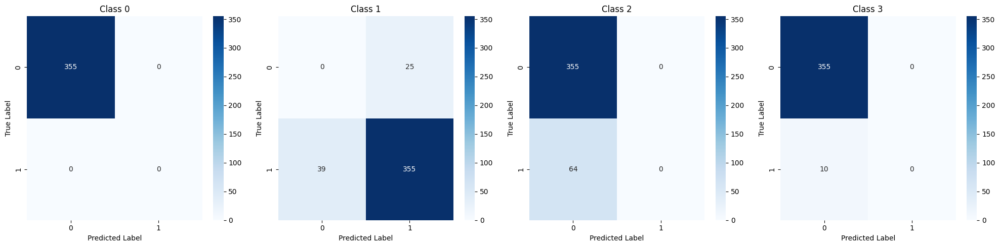

************************************************************************************************************************
Class 1
Accuracy: 0.8473
Precision: 0.9342
Recall: 0.9010
F1-Score: 0.9173
Average IoU: 0.8263
------------------------------------------------
Class 2
Accuracy: 0.0000
Precision: 0.0000
Recall: 0.0000
F1-Score: 0.0000
Average IoU: 0.0000
------------------------------------------------
Class 3
Accuracy: 0.0000
Precision: 0.0000
Recall: 0.0000
F1-Score: 0.0000
Average IoU: 0.0000
------------------------------------------------
************************************************************************************************************************
Overall Metrics
Accuracy: 0.7201
Precision: 0.9342
Recall: 0.7585
F1-Score: 0.8373
Average IoU: 0.8263
************************************************************************************************************************


In [22]:
print("************************************************************************************************************************")
for class_id, metrics in classwise_metrics.items():
  print(f"Class {class_id}")
  print(classwise_metrics[class_id],"\n")
  print("-----------------------------------")
print("************************************************************************************************************************")
print("displays of confusion matrix values")

fig, axes = plt.subplots(nrows=1, ncols=num_classes, figsize=(5*num_classes, 5))

for class_id, metrics in classwise_metrics.items():

    TP = metrics["TP"]
    FP = metrics["FP"]
    FN = metrics["FN"]
    TN = sum([classwise_metrics[i]["TP"] for i in range(num_classes)]) - TP

    confusion = np.array([[TN, FP], [FN,TP]])
    sns.heatmap(confusion, annot=True, fmt="d", cmap="Blues", ax=axes[class_id])
    axes[class_id].set_title(f"Class {class_id}")
    axes[class_id].set_ylabel("True Label")
    axes[class_id].set_xlabel("Predicted Label")


plt.tight_layout()
plt.show()
print("************************************************************************************************************************")

for class_id, metrics in classwise_metrics.items():
  if (class_id != 0) :
      TP = metrics["TP"]
      FP = metrics["FP"]
      FN = metrics["FN"]
      precision = TP / (TP + FP) if TP + FP > 0 else 0
      recall = TP / (TP + FN) if TP + FN > 0 else 0
      f1_score = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0
      avg_iou = metrics["IoU_sum"] / TP if TP > 0 else 0
      accuracy = TP / (TP + FP + FN) if TP + FP + FN > 0 else 0

      print(f"Class {class_id}")
      print(f"Accuracy: {accuracy:.4f}")
      print(f"Precision: {precision:.4f}")
      print(f"Recall: {recall:.4f}")
      print(f"F1-Score: {f1_score:.4f}")
      print(f"Average IoU: {avg_iou:.4f}")

      print("------------------------------------------------")
print("************************************************************************************************************************")
#************************************************************************************************************************
# After tests, it is interesting to see the results by class (rather than overall)
# in order to see the impact of the bias of our data on the result (the metrics confirm the bias of question 2,
# class 1 being well represented the results are satisfactory for this class)
#************************************************************************************************************************

overall_precision = sum([classwise_metrics[i]["TP"] for i in range(num_classes)]) / (sum([classwise_metrics[i]["TP"] for i in range(num_classes)]) + sum([classwise_metrics[i]["FP"] for i in range(num_classes)]))

overall_recall = sum([classwise_metrics[i]["TP"] for i in range(num_classes)]) / (sum([classwise_metrics[i]["TP"] for i in range(num_classes)]) + sum([classwise_metrics[i]["FN"] for i in range(num_classes)]))

overall_f1_score = 2 * (overall_precision * overall_recall) / (overall_precision + overall_recall)

overall_iou = sum([classwise_metrics[i]["IoU_sum"] for i in range(num_classes)]) / sum([classwise_metrics[i]["TP"] for i in range(num_classes)])

overall_accuracy = sum([classwise_metrics[i]["TP"] for i in range(num_classes)]) / (sum([classwise_metrics[i]["TP"] for i in range(num_classes)]) + sum([classwise_metrics[i]["FP"] for i in range(num_classes)]) + sum([classwise_metrics[i]["FN"] for i in range(num_classes)]))

print("Overall Metrics")
print(f"Accuracy: {overall_accuracy:.4f}")
print(f"Precision: {overall_precision:.4f}")
print(f"Recall: {overall_recall:.4f}")
print(f"F1-Score: {overall_f1_score:.4f}")
print(f"Average IoU: {overall_iou:.4f}")
print("************************************************************************************************************************")

The bias is confirmed in the results, class 1 has satisfactory results, the other classes have very low results which amounts to the non-increase of the data and imbalance of the classes

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


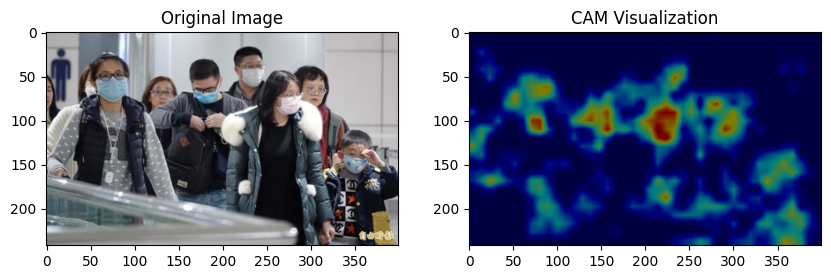

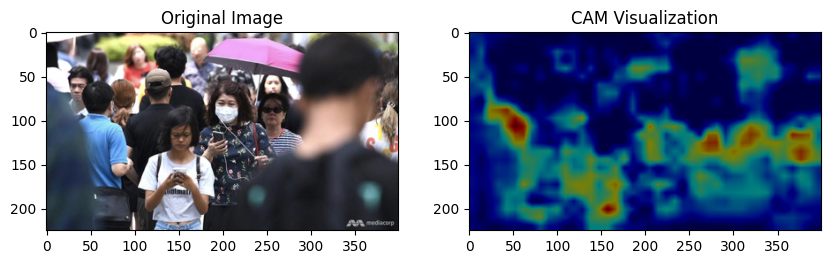

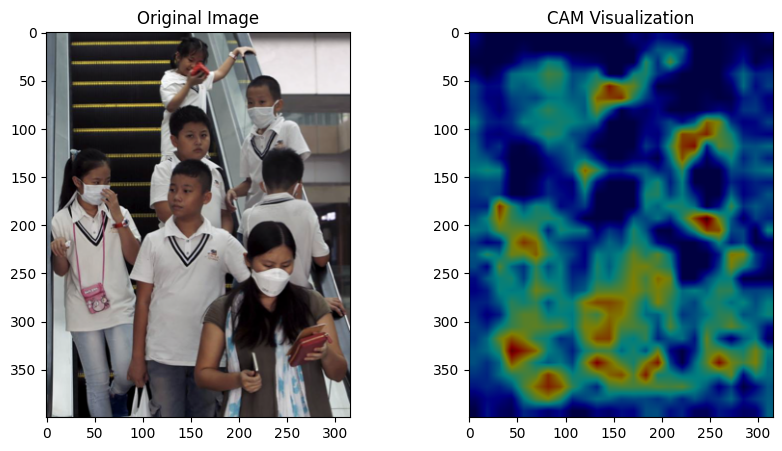

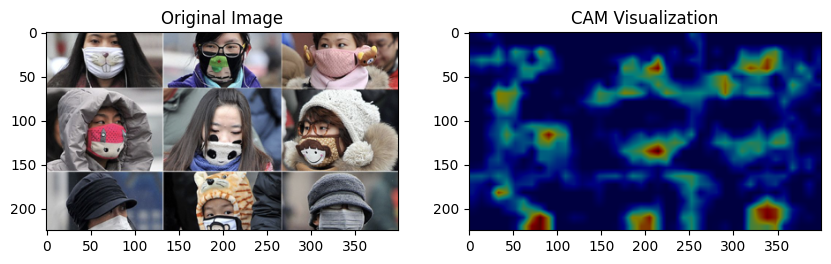

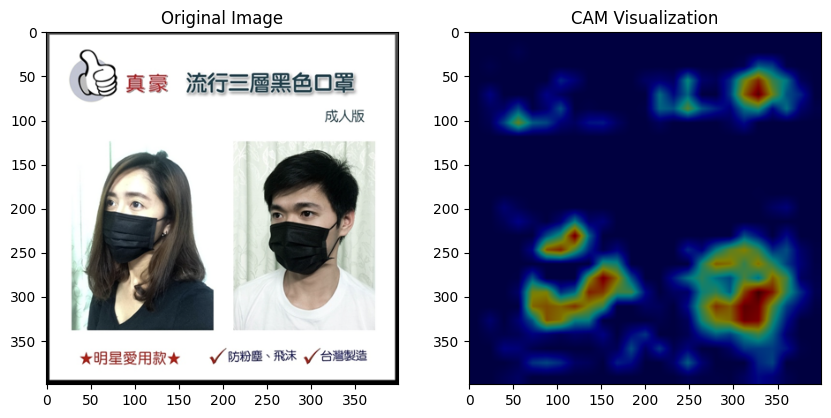

In [23]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = []
        self.activations = []
        target_layer.register_forward_hook(self.forward_hook)
        target_layer.register_backward_hook(self.backward_hook)

    def forward_hook(self, module, input, output):
        self.activations.append(output)

    def backward_hook(self, module, grad_input, grad_output):
        self.gradients.append(grad_output[0])

    def generate_cam(self, input_tensor):
        self.activations = []
        self.gradients = []
        scores = self.model(input_tensor)
        score = scores[0]['scores'][0]
        self.model.zero_grad()
        score.backward(retain_graph=True)
        gradients = self.gradients[-1].cpu().data.numpy()
        activations = self.activations[-1].cpu().data.numpy()
        activations = activations[0, :]
        weights = np.mean(gradients, axis=(2, 3))[0, :]
        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * activations[i, :, :]
        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, input_tensor.shape[2:][::-1])
        cam = cam - np.min(cam)
        cam = cam / np.max(cam)
        return cam

def visualize_cam_on_image(image, cam, alpha=0.5):
    cam = (cam - np.min(cam)) / (np.max(cam) - np.min(cam)) * 255
    cam = np.uint8(cam)

    heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
    image = image / 255.0
    overlayed_image = image * (1 - alpha) + heatmap * alpha
    overlayed_image = np.uint8(overlayed_image * 255)

    return overlayed_image

model = model.to(device)
target_layer = model.backbone.body.layer4[-1]
grad_cam = GradCAM(model, target_layer)
counter = 0
for images, _ in test_loader:
    images = [img.to(device) for img in images]
    for image in images:
        if counter >= 5:
            break
        cam = grad_cam.generate_cam(image.unsqueeze(0))
        image_np = image.permute(1, 2, 0).cpu().numpy()
        visualization = visualize_cam_on_image(image_np, cam)

        fig, axarr = plt.subplots(1, 2, figsize=(10, 5))
        axarr[0].imshow(image_np)
        axarr[0].title.set_text('Original Image')
        axarr[1].imshow(visualization)
        axarr[1].title.set_text('CAM Visualization')
        plt.show()

        counter += 1
    if counter >= 5:
        break

Like the known example of the polar bear we can see that the parts that have been taken into account are not always areas of real interest, however for the face detection parts we see that the skull is greatly requested and that these pixels contribute greatly to the decision, however for the precision of detection of the masks the interest is relatively low

# Conclusion
 it is important for this model to resolve the problem of balanced calsses and to carry out data augmentation (horizontal flips, translations, alterations of RGB channels, etc.) in order to significantly improve the model and allow it to correctly carry out learning and improve metrics